## Section A — Setup (v2: 33-class run)

In [ ]:
# Install (run once, then RESTART SESSION before continuing)
# !pip install -q torch torchvision timm albumentations einops

import torch, json, shutil, os, subprocess
from pathlib import Path

if os.path.exists('/content/drive') and not os.path.ismount('/content/drive'):
    shutil.rmtree('/content/drive')

from google.colab import drive
drive.mount('/content/drive')

DRIVE_ROOT = Path('/content/drive/MyDrive/CropClassifier_v2')
VERSION    = 'v2'
DATA_ROOT  = Path('/content/dataset/combined_resized/Volumes/STORM 1100X/combined')
OOD_ROOT   = Path('/content/drive/MyDrive/disease_detection/unseen/Diseased_and_healthy')
CKPT_DIR   = DRIVE_ROOT / 'models' / 'stage1_dinov2_v2'
CKPT_DIR.mkdir(parents=True, exist_ok=True)

IMG_SIZE = 238   # 17 * 14 — DINOv2 ViT-S/14 patch-divisible

if not DATA_ROOT.exists() or sum(1 for p in DATA_ROOT.iterdir() if p.is_dir()) < 10:
    print("Extracting combined_resized from Drive (split zip)...")
    COMBINED_SRC = Path('/content/drive/MyDrive/disease_detection/combined_resized')
    LOCAL_ZIP_DIR = Path('/content/combined_zip_parts')
    LOCAL_ZIP_DIR.mkdir(parents=True, exist_ok=True)

    if not (LOCAL_ZIP_DIR / 'combined.zip').exists():
        subprocess.run(f"cp {COMBINED_SRC}/combined.z0* {COMBINED_SRC}/combined.zip {LOCAL_ZIP_DIR}/",
                        shell=True, check=True)

    subprocess.run("which zip || apt-get -qq install -y zip", shell=True, check=True)

    FULL_ZIP = LOCAL_ZIP_DIR / 'combined_full.zip'
    if not FULL_ZIP.exists():
        result = subprocess.run(
            f"cd {LOCAL_ZIP_DIR} && zip -s 0 combined.zip --out combined_full.zip",
            shell=True, capture_output=True, text=True
        )
        if result.returncode != 0:
            print("❌ STDERR:", result.stderr[-2000:])
            raise RuntimeError("Recombine failed — check output above")

    Path("/content/dataset/combined_resized").mkdir(parents=True, exist_ok=True)
    subprocess.run(
        f'unzip -q -o "{FULL_ZIP}" -d "/content/dataset/combined_resized" -x "__MACOSX/*" "*/._*"',
        shell=True, check=True
    )
    print("✅ Image data extracted")
else:
    print("✅ Image data already on disk, skipping extraction")

BG_POOL_DIR = Path('/content/dataset/backgrounds')
BG_BACKUP_ZIP = DRIVE_ROOT / 'backgrounds.zip'
if not BG_POOL_DIR.exists() or len(list(BG_POOL_DIR.glob('*'))) == 0:
    print("Restoring backgrounds from Drive...")
    subprocess.run(f"unzip -q -o {BG_BACKUP_ZIP} -d /content/dataset/", shell=True, check=True)
    print(f"✅ Restored {len(list(BG_POOL_DIR.glob('*'))):,} background images")
else:
    print(f"✅ Backgrounds already present: {len(list(BG_POOL_DIR.glob('*'))):,}")

with open(DRIVE_ROOT / f'class_to_idx_{VERSION}.json') as f:
    class_to_idx = json.load(f)
NUM_CLASSES = len(class_to_idx)

with open(DRIVE_ROOT / f'loss_weights_{VERSION}.json') as f:
    loss_weights_payload = json.load(f)
loss_weights = torch.tensor(loss_weights_payload['weights']).float()

print(f"\nClasses: {NUM_CLASSES}")
assert set(loss_weights_payload['crop_order']) == set(class_to_idx.keys()), \
    "MISMATCH: loss weight crop order doesn't match class_to_idx — do not proceed"
assert list(class_to_idx.values()) == list(range(NUM_CLASSES)), \
    "MISMATCH: class_to_idx indices are not contiguous 0..N-1 — do not proceed"
print("✅ class_to_idx and loss_weights verified consistent")

required = {
    f'train_manifest_{VERSION}.csv': DRIVE_ROOT / f'train_manifest_{VERSION}.csv',
    f'val_manifest_{VERSION}.csv':   DRIVE_ROOT / f'val_manifest_{VERSION}.csv',
    f'test_manifest_{VERSION}.csv':  DRIVE_ROOT / f'test_manifest_{VERSION}.csv',
    f'class_to_idx_{VERSION}.json':  DRIVE_ROOT / f'class_to_idx_{VERSION}.json',
    f'loss_weights_{VERSION}.json':  DRIVE_ROOT / f'loss_weights_{VERSION}.json',
    'DATA_ROOT populated':   DATA_ROOT,
    'backgrounds populated': BG_POOL_DIR,
    'OOD_ROOT':              OOD_ROOT,
}
all_ok = True
for name, path in required.items():
    exists = path.exists() and (path.is_file() or any(path.iterdir()))
    print(f"  {'✅' if exists else '❌ MISSING'}  {name}")
    all_ok = all_ok and exists

print(f"\nGPU available: {torch.cuda.is_available()}",
      f"({torch.cuda.get_device_name(0)})" if torch.cuda.is_available() else "")
print("\n✅ Section A complete — safe to proceed to Section B" if all_ok else "\n❌ Fix missing items before proceeding")

Mounted at /content/drive
Extracting combined_resized from Drive (split zip)...
✅ Image data extracted
Restoring backgrounds from Drive...
✅ Restored 1,400 background images

Classes: 33
✅ class_to_idx and loss_weights verified consistent
  ✅  train_manifest_v2.csv
  ✅  val_manifest_v2.csv
  ✅  test_manifest_v2.csv
  ✅  class_to_idx_v2.json
  ✅  loss_weights_v2.json
  ✅  DATA_ROOT populated
  ✅  backgrounds populated
  ✅  OOD_ROOT

GPU available: True (NVIDIA L4)

✅ Section A complete — safe to proceed to Section B


# SECTION B: CropDataset — 33-class (v2), bg_type-routed transforms

In [ ]:
import cv2
import numpy as np
import random
import pandas as pd
from pathlib import Path
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset

NORM_MEAN = [0.485, 0.456, 0.406]
NORM_STD  = [0.229, 0.224, 0.225]

class RandomBackgroundPaste(A.ImageOnlyTransform):
    def __init__(self, bg_pool_dir, p=0.5):
        super().__init__(p=p)
        self.bg_paths = list(Path(bg_pool_dir).glob('*'))
        assert len(self.bg_paths) > 0, f"No backgrounds found in {bg_pool_dir}"

    def apply(self, img, **kwargs):
        h, w = img.shape[:2]
        bg_path = random.choice(self.bg_paths)
        bg = np.array(Image.open(bg_path).convert('RGB').resize((w, h)))
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        _, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        border = np.concatenate([
            otsu[:5, :].flatten(), otsu[-5:, :].flatten(),
            otsu[:, :5].flatten(), otsu[:, -5:].flatten()
        ])
        bg_is_white = (border == 255).mean() > 0.5
        leaf_mask = (otsu == 0) if bg_is_white else (otsu == 255)
        leaf_mask3 = np.stack([leaf_mask] * 3, axis=-1)
        return np.where(leaf_mask3, img, bg).astype(np.uint8)

def build_transforms(img_size, bg_pool_dir):
    paste_eligible_transform = A.Compose([
        A.RandomResizedCrop(size=(img_size, img_size), scale=(0.6, 1.0), interpolation=cv2.INTER_CUBIC),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.3),
        A.Rotate(limit=30, p=0.5, border_mode=cv2.BORDER_REFLECT),
        A.Transpose(p=0.3),
        RandomBackgroundPaste(bg_pool_dir=bg_pool_dir, p=0.5),
        A.OneOf([
            A.RandomBrightnessContrast(brightness_limit=0.25, contrast_limit=0.25),
            A.HueSaturationValue(hue_shift_limit=15, sat_shift_limit=30, val_shift_limit=20),
        ], p=0.6),
        A.GaussianBlur(blur_limit=(3, 5), p=0.15),
        A.CoarseDropout(num_holes_range=(1, 6), hole_height_range=(8, 24), hole_width_range=(8, 24), p=0.3),
        A.Normalize(mean=NORM_MEAN, std=NORM_STD),
        ToTensorV2(),
    ])
    natural_transform = A.Compose([
        A.RandomResizedCrop(size=(img_size, img_size), scale=(0.7, 1.0), interpolation=cv2.INTER_CUBIC),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.3),
        A.Rotate(limit=20, p=0.4, border_mode=cv2.BORDER_REFLECT),
        A.OneOf([
            A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3),
            A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=35, val_shift_limit=25),
            A.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15),
        ], p=0.7),
        A.OneOf([
            A.ImageCompression(quality_range=(40, 95)),
            A.Downscale(scale_range=(0.4, 0.8)),
        ], p=0.3),
        A.GaussianBlur(blur_limit=(3, 7), p=0.2),
        A.GaussNoise(p=0.2),
        A.CoarseDropout(num_holes_range=(1, 6), hole_height_range=(8, 24), hole_width_range=(8, 24), p=0.3),
        A.Normalize(mean=NORM_MEAN, std=NORM_STD),
        ToTensorV2(),
    ])
    val_transform = A.Compose([
        A.SmallestMaxSize(max_size=IMG_SIZE, interpolation=cv2.INTER_CUBIC),
        A.CenterCrop(height=IMG_SIZE, width=IMG_SIZE, pad_if_needed=True,
                 border_mode=cv2.BORDER_REFLECT),
        A.Normalize(mean=NORM_MEAN, std=NORM_STD),
        ToTensorV2(),
    ])
    return paste_eligible_transform, natural_transform, val_transform

paste_eligible_transform, natural_transform, val_transform = build_transforms(IMG_SIZE, BG_POOL_DIR)


class CropDataset(Dataset):
    """Routes each row to the correct transform based on bg_type.
    Missing files are logged and skipped (returns None; use the
    collate_fn below to drop them) rather than crashing mid-epoch."""

    def __init__(self, manifest_path, class_to_idx, data_root, split='train'):
        self.df = pd.read_csv(manifest_path)
        self.class_to_idx = class_to_idx
        self.data_root = Path(data_root)
        self.split = split
        self._missing_logged = 0

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        fpath = self.data_root / row['filepath']

        if not fpath.exists():
            self._missing_logged += 1
            if self._missing_logged <= 20:
                print(f"⚠️  [{self.split}] missing file, skipping: {row['filepath']}")
            return None

        try:
            img = np.array(Image.open(fpath).convert('RGB'))
        except Exception as e:
            print(f"⚠️  [{self.split}] unreadable file, skipping: {row['filepath']} ({e})")
            return None

        if self.split == 'train':
            bg_type = row.get('bg_type', 'natural')
            transform = paste_eligible_transform if bg_type == 'paste_eligible' else natural_transform
        else:
            transform = val_transform

        img_tensor = transform(image=img)['image']
        label_idx = self.class_to_idx[row['crop']]
        return img_tensor, label_idx, row['filepath']


def safe_collate(batch):
    batch = [b for b in batch if b is not None]
    if len(batch) == 0:
        return None
    imgs, labels, fpaths = zip(*batch)
    import torch as _torch
    return _torch.stack(imgs), _torch.tensor(labels), list(fpaths)


train_ds = CropDataset(DRIVE_ROOT / f'train_manifest_{VERSION}.csv', class_to_idx, DATA_ROOT, split='train')
val_ds   = CropDataset(DRIVE_ROOT / f'val_manifest_{VERSION}.csv',   class_to_idx, DATA_ROOT, split='val')
test_ds  = CropDataset(DRIVE_ROOT / f'test_manifest_{VERSION}.csv',  class_to_idx, DATA_ROOT, split='test')

print(f"train_ds: {len(train_ds):,}  val_ds: {len(val_ds):,}  test_ds: {len(test_ds):,}")

sample = train_ds[0]
if sample is not None:
    img_t, label, fp = sample
    print(f"Smoke test OK — tensor shape {img_t.shape}, label {label}, file {fp}")
else:
    print("⚠️ First sample was missing — dataset may have file path issues, check DATA_ROOT")

train_ds: 117,231  val_ds: 25,121  test_ds: 25,122
Smoke test OK — tensor shape torch.Size([3, 238, 238]), label 16, file mango/Powdery Mildew/FGEFEFEGYI.jpg


# SECTION C: DataLoaders

In [ ]:
from torch.utils.data import DataLoader

BATCH_SIZE = 64  # adjust down if hit OOM on your Colab GPU tier

train_loader = DataLoader(
    train_ds, batch_size=BATCH_SIZE, shuffle=True,
    num_workers=2, pin_memory=True, drop_last=True,
    collate_fn=safe_collate,
)
val_loader = DataLoader(
    val_ds, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=2, pin_memory=True,
    collate_fn=safe_collate,
)
test_loader = DataLoader(
    test_ds, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=2, pin_memory=True,
    collate_fn=safe_collate,
)

print(f"train_loader: {len(train_loader)} batches  ({len(train_ds):,} samples)")
print(f"val_loader:   {len(val_loader)} batches  ({len(val_ds):,} samples)")
print(f"test_loader:  {len(test_loader)} batches  ({len(test_ds):,} samples)")

batch = next(iter(train_loader))
if batch is not None:
    imgs, labels, fpaths = batch
    print(f"\nBatch shape: {imgs.shape}, labels shape: {labels.shape}")
    print(f"Label range: {labels.min().item()}–{labels.max().item()} (expect 0–{NUM_CLASSES-1})")
    from collections import Counter
    idx_to_crop = {v: k for k, v in class_to_idx.items()}
    dist = Counter(idx_to_crop[l.item()] for l in labels)
    print(f"Classes in this batch: {dict(dist)}")
else:
    print("⚠️ First batch was entirely None — check DATA_ROOT / manifest paths")

train_loader: 1831 batches  (117,231 samples)
val_loader:   393 batches  (25,121 samples)
test_loader:  393 batches  (25,122 samples)

Batch shape: torch.Size([64, 3, 238, 238]), labels shape: torch.Size([64])
Label range: 0–32 (expect 0–32)
Classes in this batch: {'orange': 8, 'peach': 2, 'coconut': 4, 'cherry': 3, 'groundnut': 3, 'chilli': 1, 'corn': 6, 'bell_pepper': 2, 'dragon_fruit': 1, 'cotton': 5, 'soybean': 2, 'tomato': 7, 'lemon': 1, 'paddy': 3, 'apple': 1, 'potato': 2, 'pumpkin': 1, 'grape': 2, 'jute': 1, 'tea': 3, 'mango': 1, 'sugarcane': 2, 'bean': 1, 'wheat': 1, 'strawberry': 1}


# SECTION D: DINOv2 ViT-S/14 with staged fine-tuning + resume (v2, 33 classes)

In [ ]:
import torch
import torch.nn as nn

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

class DinoV2Classifier(nn.Module):
    def __init__(self, num_classes, backbone_name='dinov2_vits14'):
        super().__init__()
        self.backbone = torch.hub.load('facebookresearch/dinov2', backbone_name)
        self.head = nn.Linear(self.backbone.embed_dim, num_classes)  # 384 for ViT-S

    def forward(self, x):
        feats = self.backbone(x)   # [B, 384] — CLS token pooled output
        return self.head(feats)


def set_trainable_stage(model, stage: str):
    """stage in {'A', 'B', 'C'}. Controls what's frozen/unfrozen.
    Returns param groups for the optimizer (differential LR)."""
    for p in model.backbone.parameters():
        p.requires_grad = False
    for p in model.head.parameters():
        p.requires_grad = True

    if stage == 'A':
        param_groups = [{'params': model.head.parameters(), 'lr': 1e-3}]

    elif stage == 'B':
        last_blocks = model.backbone.blocks[-4:]
        for block in last_blocks:
            for p in block.parameters():
                p.requires_grad = True
        param_groups = [
            {'params': [p for b in last_blocks for p in b.parameters()], 'lr': 1e-5},
            {'params': model.head.parameters(), 'lr': 1e-4},
        ]

    elif stage == 'C':
        for p in model.backbone.parameters():
            p.requires_grad = True
        param_groups = [{'params': model.parameters(), 'lr': 5e-6}]

    else:
        raise ValueError(f"Unknown stage: {stage}")

    n_trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    n_total = sum(p.numel() for p in model.parameters())
    print(f"Stage {stage}: {n_trainable:,} / {n_total:,} params trainable")
    return param_groups


model = DinoV2Classifier(NUM_CLASSES).to(device)
print(f"\nModel loaded — head output: {NUM_CLASSES} classes, embed_dim: {model.backbone.embed_dim}")

# Resume logic — checkpoint holds EVERYTHING needed to continue:
# model state, optimizer state, scheduler state, epoch, stage, best F1.
# This cell is idempotent: safe to re-run after any disconnect.

CKPT_PATH = CKPT_DIR / 'latest_checkpoint.pt'
BEST_CKPT_PATH = CKPT_DIR / 'best_checkpoint.pt'

def load_checkpoint_if_exists():
    if CKPT_PATH.exists():
        print(f"Found checkpoint at {CKPT_PATH} — resuming")
        ckpt = torch.load(CKPT_PATH, map_location=device)
        model.load_state_dict(ckpt['model_state'])
        assert ckpt['class_to_idx'] == class_to_idx, \
            "❌ Checkpoint class_to_idx doesn't match current class mapping — do not resume blindly"
        print(f"  Resumed at epoch {ckpt['epoch']}, stage {ckpt['stage']}, best F1 {ckpt['best_f1']:.4f}")
        return ckpt
    else:
        print("No checkpoint found — starting fresh from Stage A, epoch 1")
        return None

resume_state = load_checkpoint_if_exists()
current_stage = resume_state['stage'] if resume_state else 'A'
start_epoch   = resume_state['epoch'] + 1 if resume_state else 1
best_f1       = resume_state['best_f1'] if resume_state else 0.0

param_groups = set_trainable_stage(model, current_stage)

Downloading: "https://github.com/facebookresearch/dinov2/zipball/main" to /root/.cache/torch/hub/main.zip


/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vits14/dinov2_vits14_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vits14_pretrain.pth


100%|██████████| 84.2M/84.2M [00:00<00:00, 185MB/s]



Model loaded — head output: 33 classes, embed_dim: 384
Found checkpoint at /content/drive/MyDrive/CropClassifier_v2/models/stage1_dinov2_v2/latest_checkpoint.pt — resuming
  Resumed at epoch 15, stage B, best F1 0.9991
Stage B: 7,113,633 / 22,069,281 params trainable


# SECTION E: Loss, Optimizer, Scheduler

In [ ]:
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR

criterion = nn.CrossEntropyLoss(weight=loss_weights.to(device), label_smoothing=0.1)

STAGE_EPOCHS = {'A': 5, 'B': 15, 'C': 25}
STAGE_T_MAX  = {'A': 5, 'B': 10, 'C': 10}


optimizer = AdamW(param_groups, weight_decay=1e-4)
scheduler = CosineAnnealingLR(optimizer, T_max=STAGE_T_MAX[current_stage])

if resume_state is not None:
    try:
        optimizer.load_state_dict(resume_state['optimizer_state'])
        scheduler.load_state_dict(resume_state['scheduler_state'])
        print("✅ Optimizer + scheduler state restored")
    except Exception as e:
        print(f"⚠️ Could not restore optimizer/scheduler state ({e}) — continuing with fresh state, "
              f"model weights are still correctly restored")

print(f"\nReady to train — starting at epoch {start_epoch}, stage {current_stage}")
print(f"Loss weights: min={loss_weights.min():.3f}, max={loss_weights.max():.3f}")

✅ Optimizer + scheduler state restored

Ready to train — starting at epoch 16, stage B
Loss weights: min=0.439, max=2.865


# SECTION F: Training loop — per-epoch checkpointing, resumable (v2)

In [ ]:
import json, time
from datetime import datetime
from sklearn.metrics import f1_score
from tqdm.auto import tqdm

F1_HISTORY_PATH = CKPT_DIR / 'f1_history.json'
WATCH_LIST = ['okra', 'wheat', 'dragon_fruit', 'snake_gourd', 'onion', 'jute', 'blackgram_greengram', 'eggplant']
# v2: cotton + soybean now included as full classes (no longer excluded).
# okra added — smallest class this run at 197 train images after dedup.
F1_FLOOR = 0.5
idx_to_crop = {v: k for k, v in class_to_idx.items()}

def load_f1_history():
    if F1_HISTORY_PATH.exists():
        with open(F1_HISTORY_PATH) as f:
            return json.load(f)
    return []

def save_f1_history(history):
    tmp = F1_HISTORY_PATH.with_suffix('.json.tmp')
    with open(tmp, 'w') as f:
        json.dump(history, f, indent=2)
    tmp.replace(F1_HISTORY_PATH)

def save_checkpoint(path, epoch, stage, best_f1):
    tmp = path.with_suffix('.pt.tmp')
    torch.save({
        'model_state': model.state_dict(),
        'optimizer_state': optimizer.state_dict(),
        'scheduler_state': scheduler.state_dict(),
        'epoch': epoch,
        'stage': stage,
        'best_f1': best_f1,
        'class_to_idx': class_to_idx,
    }, tmp)
    tmp.replace(path)


def train_one_epoch(loader):
    model.train()
    total_loss, n_batches = 0.0, 0
    for batch in tqdm(loader, desc="train", leave=False):
        if batch is None:
            continue
        imgs, labels, _ = batch
        imgs, labels = imgs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        n_batches += 1
    return total_loss / max(n_batches, 1)


@torch.no_grad()
def validate(loader):
    model.eval()
    total_loss, n_batches = 0.0, 0
    all_preds, all_labels = [], []
    for batch in tqdm(loader, desc="val", leave=False):
        if batch is None:
            continue
        imgs, labels, _ = batch
        imgs, labels = imgs.to(device), labels.to(device)

        outputs = model(imgs)
        loss = criterion(outputs, labels)
        total_loss += loss.item()
        n_batches += 1

        preds = outputs.argmax(dim=1)
        all_preds.extend(preds.cpu().tolist())
        all_labels.extend(labels.cpu().tolist())

    val_loss = total_loss / max(n_batches, 1)
    macro_f1 = f1_score(all_labels, all_preds, average='macro', zero_division=0)
    per_class_f1 = f1_score(all_labels, all_preds, average=None, zero_division=0,
                             labels=list(range(NUM_CLASSES)))
    per_class_f1_dict = {idx_to_crop[i]: float(f) for i, f in enumerate(per_class_f1)}
    return val_loss, macro_f1, per_class_f1_dict


def print_per_class_table(per_class_f1_dict):
    print(f"\n{'Crop':20s} {'F1':>6}")
    print("-" * 28)
    for crop, f1 in sorted(per_class_f1_dict.items(), key=lambda x: x[1]):
        flag = "  ⚠️ BELOW FLOOR" if f1 < F1_FLOOR else ""
        watch = "  [watch]" if crop in WATCH_LIST else ""
        print(f"  {crop:20s} {f1:>6.3f}{watch}{flag}")


history = load_f1_history()
epochs_since_improve = 0
MAX_EPOCH = STAGE_EPOCHS['C']

epoch = start_epoch
while epoch <= MAX_EPOCH:
    if epoch > STAGE_EPOCHS[current_stage]:
        if current_stage == 'A':
            current_stage = 'B'
        elif current_stage == 'B':
            print("\n🔔 Stage B complete. Stage C (full unfreeze) is optional — "
                  "only trigger manually if OOD plateaus. Stopping here for now.")
            break
        param_groups = set_trainable_stage(model, current_stage)
        optimizer = AdamW(param_groups, weight_decay=1e-4)
        scheduler = CosineAnnealingLR(optimizer, T_max=STAGE_T_MAX[current_stage])
        criterion = nn.CrossEntropyLoss(weight=loss_weights.to(device), label_smoothing=0.1)
        epochs_since_improve = 0
        print(f"\n{'='*50}\nTransitioned to Stage {current_stage} at epoch {epoch}\n{'='*50}")

    print(f"\n--- Epoch {epoch} (Stage {current_stage}) ---")
    t0 = time.time()

    train_loss = train_one_epoch(train_loader)
    val_loss, macro_f1, per_class_f1 = validate(val_loader)
    scheduler.step()

    elapsed = time.time() - t0
    print(f"train_loss={train_loss:.4f}  val_loss={val_loss:.4f}  "
          f"macro_f1={macro_f1:.4f}  ({elapsed:.0f}s)")
    print_per_class_table(per_class_f1)

    history.append({
        'epoch': epoch, 'stage': current_stage,
        'train_loss': train_loss, 'val_loss': val_loss,
        'macro_f1': macro_f1, 'per_class_f1': per_class_f1,
        'timestamp': datetime.now().strftime('%Y-%m-%d %H:%M'),
    })
    save_f1_history(history)

    save_checkpoint(CKPT_PATH, epoch, current_stage, best_f1)
    if macro_f1 > best_f1:
        best_f1 = macro_f1
        save_checkpoint(BEST_CKPT_PATH, epoch, current_stage, best_f1)
        epochs_since_improve = 0
        print(f"  ✅ New best macro F1: {best_f1:.4f} — saved to best_checkpoint.pt")
    else:
        epochs_since_improve += 1
        print(f"  No improvement ({epochs_since_improve} epoch(s) since best={best_f1:.4f})")

    if epochs_since_improve >= 5:
        print(f"\n🛑 Early stopping — no improvement in 5 epochs within Stage {current_stage}")
        if current_stage == 'A':
            current_stage = 'B'
            param_groups = set_trainable_stage(model, current_stage)
            optimizer = AdamW(param_groups, weight_decay=1e-4)
            scheduler = CosineAnnealingLR(optimizer, T_max=STAGE_T_MAX[current_stage])
            epochs_since_improve = 0
            epoch += 1
            continue
        else:
            print("Stopping training.")
            break

    epoch += 1

print(f"\n✅ Training loop finished at epoch {epoch-1}, stage {current_stage}, best F1 {best_f1:.4f}")
print(f"   f1_history.json: {len(history)} epochs recorded on Drive")


--- Epoch 1 (Stage A) ---


train:   0%|          | 0/1831 [00:00<?, ?it/s]

val:   0%|          | 0/393 [00:00<?, ?it/s]

train_loss=1.4575  val_loss=1.1556  macro_f1=0.9779  (347s)

Crop                     F1
----------------------------
  wheat                 0.891  [watch]
  bean                  0.916
  blackgram_greengram   0.917  [watch]
  soybean               0.928
  snake_gourd           0.958  [watch]
  eggplant              0.962  [watch]
  okra                  0.966  [watch]
  mango                 0.968
  cherry                0.972
  potato                0.974
  onion                 0.978  [watch]
  apple                 0.981
  jute                  0.981  [watch]
  tomato                0.983
  sugarcane             0.989
  bell_pepper           0.990
  peach                 0.990
  strawberry            0.990
  pumpkin               0.990
  coffee                0.993
  pineapple             0.994
  cotton                0.994
  lemon                 0.995
  orange                0.996
  grape                 0.996
  chilli                0.997
  groundnut             0.997
  corn   

train:   0%|          | 0/1831 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

val:   0%|          | 0/393 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

train_loss=1.3523  val_loss=1.1572  macro_f1=0.9822  (353s)

Crop                     F1
----------------------------
  blackgram_greengram   0.864  [watch]
  soybean               0.911
  wheat                 0.952  [watch]
  snake_gourd           0.959  [watch]
  cherry                0.974
  bean                  0.976
  jute                  0.977  [watch]
  potato                0.978
  bell_pepper           0.981
  tomato                0.982
  apple                 0.982
  mango                 0.983
  okra                  0.989  [watch]
  lemon                 0.991
  onion                 0.991  [watch]
  orange                0.991
  eggplant              0.993  [watch]
  chilli                0.993
  cotton                0.993
  pumpkin               0.994
  sugarcane             0.994
  raspberry             0.994
  groundnut             0.994
  peach                 0.995
  coffee                0.995
  strawberry            0.996
  tea                   0.997
  grape  

train:   0%|          | 0/1831 [00:00<?, ?it/s]

val:   0%|          | 0/393 [00:00<?, ?it/s]

train_loss=1.3303  val_loss=1.1359  macro_f1=0.9860  (352s)

Crop                     F1
----------------------------
  blackgram_greengram   0.918  [watch]
  soybean               0.945
  snake_gourd           0.958  [watch]
  wheat                 0.967  [watch]
  bean                  0.970
  cherry                0.979
  mango                 0.980
  coffee                0.981
  potato                0.984
  tomato                0.984
  jute                  0.985  [watch]
  apple                 0.986
  lemon                 0.986
  bell_pepper           0.987
  okra                  0.989  [watch]
  pumpkin               0.991
  sugarcane             0.992
  cotton                0.994
  pineapple             0.995
  orange                0.995
  strawberry            0.995
  peach                 0.996
  groundnut             0.996
  chilli                0.997
  eggplant              0.998  [watch]
  paddy                 0.998
  grape                 0.998
  corn            

train:   0%|          | 0/1831 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

val:   0%|          | 0/393 [00:00<?, ?it/s]

train_loss=1.3114  val_loss=1.1257  macro_f1=0.9874  (353s)

Crop                     F1
----------------------------
  okra                  0.925  [watch]
  soybean               0.957
  blackgram_greengram   0.958  [watch]
  bean                  0.970
  wheat                 0.974  [watch]
  snake_gourd           0.976  [watch]
  cherry                0.979
  jute                  0.981  [watch]
  potato                0.984
  apple                 0.984
  tomato                0.985
  mango                 0.985
  bell_pepper           0.990
  chilli                0.990
  raspberry             0.994
  eggplant              0.995  [watch]
  pumpkin               0.995
  coffee                0.995
  peach                 0.996
  cotton                0.996
  sugarcane             0.996
  strawberry            0.996
  orange                0.997
  pineapple             0.997
  lemon                 0.997
  groundnut             0.998
  grape                 0.998
  tea             

train:   0%|          | 0/1831 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

val:   0%|          | 0/393 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

train_loss=1.2998  val_loss=1.1182  macro_f1=0.9888  (354s)

Crop                     F1
----------------------------
  blackgram_greengram   0.937  [watch]
  soybean               0.951
  bean                  0.971
  wheat                 0.975  [watch]
  snake_gourd           0.977  [watch]
  cherry                0.979
  apple                 0.983
  tomato                0.985
  potato                0.985
  mango                 0.986
  okra                  0.989  [watch]
  jute                  0.989  [watch]
  bell_pepper           0.991
  eggplant              0.993  [watch]
  strawberry            0.994
  lemon                 0.994
  coffee                0.994
  chilli                0.995
  onion                 0.996  [watch]
  cotton                0.996
  pumpkin               0.996
  sugarcane             0.996
  peach                 0.996
  orange                0.997
  pineapple             0.997
  raspberry             0.997
  tea                   0.998
  grape  

train:   0%|          | 0/1831 [00:00<?, ?it/s]

val:   0%|          | 0/393 [00:00<?, ?it/s]

train_loss=1.1921  val_loss=1.0490  macro_f1=0.9961  (531s)

Crop                     F1
----------------------------
  eggplant              0.967  [watch]
  wheat                 0.975  [watch]
  okra                  0.989  [watch]
  cotton                0.992
  soybean               0.992
  potato                0.992
  tomato                0.993
  apple                 0.995
  cherry                0.996
  jute                  0.996  [watch]
  pineapple             0.997
  mango                 0.997
  bell_pepper           0.998
  peach                 0.998
  strawberry            0.999
  sugarcane             0.999
  coconut               0.999
  grape                 0.999
  groundnut             1.000
  paddy                 1.000
  bean                  1.000
  blackgram_greengram   1.000  [watch]
  chilli                1.000
  coffee                1.000
  corn                  1.000
  dragon_fruit          1.000  [watch]
  lemon                 1.000
  onion           

train:   0%|          | 0/1831 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

val:   0%|          | 0/393 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

train_loss=1.1107  val_loss=1.0169  macro_f1=0.9985  (531s)

Crop                     F1
----------------------------
  okra                  0.989  [watch]
  wheat                 0.992  [watch]
  soybean               0.994
  potato                0.995
  tomato                0.996
  blackgram_greengram   0.997  [watch]
  eggplant              0.998  [watch]
  pineapple             0.998
  cotton                0.998
  apple                 0.999
  bell_pepper           0.999
  cherry                0.999
  peach                 0.999
  orange                1.000
  bean                  1.000
  chilli                1.000
  coconut               1.000
  coffee                1.000
  corn                  1.000
  dragon_fruit          1.000  [watch]
  grape                 1.000
  groundnut             1.000
  jute                  1.000  [watch]
  lemon                 1.000
  mango                 1.000
  onion                 1.000  [watch]
  paddy                 1.000
  pumpkin

train:   0%|          | 0/1831 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

val:   0%|          | 0/393 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

train_loss=1.0787  val_loss=1.0100  macro_f1=0.9982  (532s)

Crop                     F1
----------------------------
  blackgram_greengram   0.980  [watch]
  wheat                 0.992  [watch]
  soybean               0.992
  bean                  0.993
  jute                  0.996  [watch]
  coffee                0.998
  potato                0.998
  bell_pepper           0.998
  tomato                0.998
  pineapple             0.998
  mango                 0.998
  strawberry            0.999
  apple                 0.999
  cherry                1.000
  orange                1.000
  chilli                1.000
  coconut               1.000
  corn                  1.000
  cotton                1.000
  dragon_fruit          1.000  [watch]
  eggplant              1.000  [watch]
  grape                 1.000
  groundnut             1.000
  lemon                 1.000
  okra                  1.000  [watch]
  onion                 1.000  [watch]
  paddy                 1.000
  peach  

train:   0%|          | 0/1831 [00:00<?, ?it/s]

val:   0%|          | 0/393 [00:00<?, ?it/s]

train_loss=1.0577  val_loss=1.0008  macro_f1=0.9986  (531s)

Crop                     F1
----------------------------
  okra                  0.989  [watch]
  soybean               0.990
  blackgram_greengram   0.990  [watch]
  potato                0.997
  coffee                0.998
  peach                 0.998
  bell_pepper           0.998
  bean                  0.998
  mango                 0.998
  tomato                0.999
  apple                 0.999
  cotton                0.999
  cherry                1.000
  orange                1.000
  chilli                1.000
  coconut               1.000
  corn                  1.000
  dragon_fruit          1.000  [watch]
  eggplant              1.000  [watch]
  grape                 1.000
  groundnut             1.000
  jute                  1.000  [watch]
  lemon                 1.000
  onion                 1.000  [watch]
  paddy                 1.000
  pineapple             1.000
  pumpkin               1.000
  raspberry       

train:   0%|          | 0/1831 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

val:   0%|          | 0/393 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

train_loss=1.0451  val_loss=0.9954  macro_f1=0.9989  (531s)

Crop                     F1
----------------------------
  okra                  0.989  [watch]
  wheat                 0.992  [watch]
  soybean               0.996
  blackgram_greengram   0.997  [watch]
  coffee                0.998
  pineapple             0.998
  bell_pepper           0.999
  tomato                0.999
  cotton                0.999
  cherry                1.000
  potato                1.000
  apple                 1.000
  orange                1.000
  bean                  1.000
  chilli                1.000
  coconut               1.000
  corn                  1.000
  dragon_fruit          1.000  [watch]
  eggplant              1.000  [watch]
  grape                 1.000
  groundnut             1.000
  jute                  1.000  [watch]
  lemon                 1.000
  mango                 1.000
  onion                 1.000  [watch]
  paddy                 1.000
  peach                 1.000
  pumpkin

train:   0%|          | 0/1831 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

val:   0%|          | 0/393 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

train_loss=1.0353  val_loss=0.9915  macro_f1=0.9991  (531s)

Crop                     F1
----------------------------
  okra                  0.989  [watch]
  wheat                 0.991  [watch]
  soybean               0.997
  pineapple             0.998
  bell_pepper           0.999
  potato                0.999
  tomato                0.999
  peach                 0.999
  apple                 0.999
  cotton                0.999
  cherry                1.000
  bean                  1.000
  blackgram_greengram   1.000  [watch]
  chilli                1.000
  coconut               1.000
  coffee                1.000
  corn                  1.000
  dragon_fruit          1.000  [watch]
  eggplant              1.000  [watch]
  grape                 1.000
  groundnut             1.000
  jute                  1.000  [watch]
  lemon                 1.000
  mango                 1.000
  onion                 1.000  [watch]
  orange                1.000
  paddy                 1.000
  pumpkin

train:   0%|          | 0/1831 [00:00<?, ?it/s]

val:   0%|          | 0/393 [00:00<?, ?it/s]

train_loss=1.0277  val_loss=0.9889  macro_f1=0.9991  (530s)

Crop                     F1
----------------------------
  okra                  0.989  [watch]
  wheat                 0.992  [watch]
  coffee                0.998
  soybean               0.998
  pineapple             0.998
  bell_pepper           0.999
  potato                0.999
  tomato                0.999
  cotton                0.999
  orange                1.000
  apple                 1.000
  bean                  1.000
  blackgram_greengram   1.000  [watch]
  cherry                1.000
  chilli                1.000
  coconut               1.000
  corn                  1.000
  dragon_fruit          1.000  [watch]
  eggplant              1.000  [watch]
  grape                 1.000
  groundnut             1.000
  jute                  1.000  [watch]
  lemon                 1.000
  mango                 1.000
  onion                 1.000  [watch]
  paddy                 1.000
  peach                 1.000
  pumpkin

train:   0%|          | 0/1831 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

val:   0%|          | 0/393 [00:00<?, ?it/s]

train_loss=1.0232  val_loss=0.9870  macro_f1=0.9991  (531s)

Crop                     F1
----------------------------
  okra                  0.989  [watch]
  wheat                 0.992  [watch]
  soybean               0.998
  pineapple             0.998
  bell_pepper           0.999
  coffee                0.999
  potato                0.999
  tomato                0.999
  cotton                0.999
  orange                1.000
  apple                 1.000
  bean                  1.000
  blackgram_greengram   1.000  [watch]
  cherry                1.000
  chilli                1.000
  coconut               1.000
  corn                  1.000
  dragon_fruit          1.000  [watch]
  eggplant              1.000  [watch]
  grape                 1.000
  groundnut             1.000
  jute                  1.000  [watch]
  lemon                 1.000
  mango                 1.000
  onion                 1.000  [watch]
  paddy                 1.000
  peach                 1.000
  pumpkin

train:   0%|          | 0/1831 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

val:   0%|          | 0/393 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

train_loss=1.0189  val_loss=0.9860  macro_f1=0.9991  (530s)

Crop                     F1
----------------------------
  okra                  0.989  [watch]
  wheat                 0.992  [watch]
  soybean               0.998
  pineapple             0.998
  mango                 0.998
  bell_pepper           0.999
  coffee                0.999
  potato                0.999
  apple                 0.999
  tomato                0.999
  cotton                0.999
  cherry                1.000
  orange                1.000
  bean                  1.000
  blackgram_greengram   1.000  [watch]
  chilli                1.000
  coconut               1.000
  corn                  1.000
  dragon_fruit          1.000  [watch]
  eggplant              1.000  [watch]
  grape                 1.000
  groundnut             1.000
  jute                  1.000  [watch]
  lemon                 1.000
  onion                 1.000  [watch]
  paddy                 1.000
  peach                 1.000
  pumpkin

train:   0%|          | 0/1831 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^Exception ignored in: ^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7afe5b285760>^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
^^    ^self._shutdown_workers()^
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
^^    ^if w.is_alive():^
^ ^ ^ ^ ^ ^ ^ ^

val:   0%|          | 0/393 [00:00<?, ?it/s]

train_loss=1.0169  val_loss=0.9856  macro_f1=0.9991  (530s)

Crop                     F1
----------------------------
  okra                  0.989  [watch]
  wheat                 0.992  [watch]
  soybean               0.998
  pineapple             0.998
  bell_pepper           0.999
  coffee                0.999
  potato                0.999
  tomato                0.999
  cotton                0.999
  orange                1.000
  apple                 1.000
  bean                  1.000
  blackgram_greengram   1.000  [watch]
  cherry                1.000
  chilli                1.000
  coconut               1.000
  corn                  1.000
  dragon_fruit          1.000  [watch]
  eggplant              1.000  [watch]
  grape                 1.000
  groundnut             1.000
  jute                  1.000  [watch]
  lemon                 1.000
  mango                 1.000
  onion                 1.000  [watch]
  paddy                 1.000
  peach                 1.000
  pumpkin

# SECTION G: OOD Evaluation (v2, 33 classes)

In [ ]:
import torch
from pathlib import Path
from PIL import Image
import numpy as np
from sklearn.metrics import confusion_matrix
import json
from datetime import datetime


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

CKPT_PATH = CKPT_DIR / 'latest_checkpoint.pt'
BEST_CKPT_PATH = CKPT_DIR / 'best_checkpoint.pt'
OOD_RESULTS_PATH = CKPT_DIR / 'ood_results.json'
EXCLUDE_CROPS = []
IMG_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff', '.webp'}

# OOD folder name -> canonical class_to_idx key, for cases where naming doesn't line up 1:1
ALIAS_MAP = {
    'blackgram': 'blackgram_greengram',
    'greengram': 'blackgram_greengram',
}


def load_model_from_checkpoint(ckpt_path):
    ckpt = torch.load(ckpt_path, map_location=device)
    m = DinoV2Classifier(NUM_CLASSES).to(device)
    m.load_state_dict(ckpt['model_state'])
    m.eval()
    assert ckpt['class_to_idx'] == class_to_idx, "class_to_idx mismatch — do not evaluate blindly"
    return m, ckpt['epoch'], ckpt['stage']

crop_lookup = {k.lower(): k for k in class_to_idx.keys()}
crop_lookup.update(ALIAS_MAP)  # aliases override/extend the direct lowercase matches

@torch.no_grad()
def run_ood_eval(model, ood_root=OOD_ROOT):
    ood_root = Path(ood_root)
    all_folders = sorted(p for p in ood_root.iterdir() if p.is_dir())

    all_preds, all_labels, all_crops = [], [], []
    per_crop_correct, per_crop_total = {}, {}
    matched_folders = 0

    for crop_folder in all_folders:
        folder_key = crop_folder.name.lower()
        if folder_key in EXCLUDE_CROPS:
            continue
        if folder_key not in crop_lookup:
            print(f"  ⚠️ skipping {crop_folder.name} — no match in class mapping")
            continue

        crop_name = crop_lookup[folder_key]
        matched_folders += 1
        true_idx = class_to_idx[crop_name]
        imgs = [p for p in crop_folder.iterdir() if p.suffix.lower() in IMG_EXTS]
        per_crop_correct.setdefault(crop_name, 0)
        per_crop_total.setdefault(crop_name, 0)

        for img_path in imgs:
            try:
                img = np.array(Image.open(img_path).convert('RGB'))
            except Exception:
                continue
            img_t = val_transform(image=img)['image'].unsqueeze(0).to(device)
            pred = model(img_t).argmax(dim=1).item()

            all_preds.append(pred)
            all_labels.append(true_idx)
            all_crops.append(crop_name)
            per_crop_total[crop_name] += 1
            if pred == true_idx:
                per_crop_correct[crop_name] += 1

    expected_min = NUM_CLASSES - len(EXCLUDE_CROPS) - 5
    if matched_folders < expected_min:
        raise RuntimeError(
            f"Only matched {matched_folders}/{NUM_CLASSES - len(EXCLUDE_CROPS)} expected crops — "
            f"folder naming likely doesn't align with class_to_idx. Fix before trusting any OOD number."
        )

    macro_acc = np.mean([per_crop_correct[c] / max(per_crop_total[c], 1) for c in per_crop_total])
    per_crop_acc = {c: per_crop_correct[c] / max(per_crop_total[c], 1) for c in per_crop_total}

    print(f"\nMatched {matched_folders} crop folders")
    print(f"OOD macro accuracy: {macro_acc:.4f}\n")
    print(f"{'Crop':20s} {'Acc':>6}  {'N':>4}")
    print("-" * 34)
    for crop, acc in sorted(per_crop_acc.items(), key=lambda x: x[1]):
        print(f"  {crop:20s} {acc:>6.3f}  {per_crop_total[crop]:>4d}")

    cm = confusion_matrix(all_labels, all_preds, labels=list(range(NUM_CLASSES)))
    confused_pairs = []
    for i in range(NUM_CLASSES):
        for j in range(NUM_CLASSES):
            if i != j and cm[i, j] > 0:
                confused_pairs.append((idx_to_crop[i], idx_to_crop[j], int(cm[i, j])))
    confused_pairs.sort(key=lambda x: -x[2])
    print(f"\nTop confused pairs (true -> predicted):")
    for true_c, pred_c, count in confused_pairs[:10]:
        print(f"  {true_c} -> {pred_c}: {count}")

    return macro_acc, per_crop_acc, confused_pairs


model_eval, ckpt_epoch, ckpt_stage = load_model_from_checkpoint(BEST_CKPT_PATH)
print(f"Evaluating checkpoint from epoch {ckpt_epoch}, stage {ckpt_stage}\n")
macro_acc, per_crop_acc, confused_pairs = run_ood_eval(model_eval)

results_history = []
if OOD_RESULTS_PATH.exists():
    with open(OOD_RESULTS_PATH) as f:
        results_history = json.load(f)
results_history.append({
    'epoch': ckpt_epoch, 'stage': ckpt_stage,
    'macro_acc': macro_acc, 'per_crop_acc': per_crop_acc,
    'top_confused_pairs': confused_pairs[:10],
    'timestamp': datetime.now().strftime('%Y-%m-%d %H:%M'),
})
tmp = OOD_RESULTS_PATH.with_suffix('.json.tmp')
with open(tmp, 'w') as f:
    json.dump(results_history, f, indent=2)
tmp.replace(OOD_RESULTS_PATH)
print(f"\n✅ Saved to {OOD_RESULTS_PATH}")

Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


Evaluating checkpoint from epoch 13, stage B

  ⚠️ skipping Blueberry — no match in class mapping

Matched 32 crop folders
OOD macro accuracy: 0.6269

Crop                    Acc     N
----------------------------------
  tea                   0.091    11
  bean                  0.182    11
  pineapple             0.200    10
  orange                0.231    13
  lemon                 0.300    10
  peach                 0.300    10
  chilli                0.333    12
  apple                 0.333    12
  pumpkin               0.333    12
  cherry                0.455    11
  paddy                 0.455    11
  bell_pepper           0.538    13
  blackgram_greengram   0.545    11
  okra                  0.545    11
  onion                 0.571    14
  raspberry             0.571    14
  soybean               0.583    12
  sugarcane             0.750    12
  coffee                0.786    14
  jute                  0.800    10
  tomato                0.824    17
  mango                 

In [ ]:
import matplotlib.pyplot as plt
import random

def compare_train_vs_ood(crop_name, n_samples=6, seed=0):
    """Shows N random training images next to N random OOD images for a given crop,
    so you can eyeball what's actually different between the two distributions."""
    rng = random.Random(seed)

    # --- training samples: pull from the manifest, not the raw folder, so bg_type etc. is visible ---
    train_manifest = pd.read_csv(DRIVE_ROOT / f'train_manifest_{VERSION}.csv')
    crop_rows = train_manifest[train_manifest['crop'] == crop_name]
    if len(crop_rows) == 0:
        print(f"❌ No training rows found for '{crop_name}' — check spelling against class_to_idx")
        return
    train_sample = crop_rows.sample(n=min(n_samples, len(crop_rows)), random_state=seed)

    # --- OOD samples: find the matching folder (handles aliasing like blackgram -> blackgram_greengram) ---
    ood_folder = None
    for p in Path(OOD_ROOT).iterdir():
        if p.is_dir() and crop_lookup.get(p.name.lower()) == crop_name:
            ood_folder = p
            break
    if ood_folder is None:
        print(f"❌ No OOD folder found matching '{crop_name}'")
        return
    ood_files = [p for p in ood_folder.iterdir() if p.suffix.lower() in IMG_EXTS]
    ood_sample = rng.sample(ood_files, min(n_samples, len(ood_files)))

    # --- plot side by side: top row = train, bottom row = OOD ---
    fig, axes = plt.subplots(2, n_samples, figsize=(3 * n_samples, 6.5))
    fig.suptitle(f"'{crop_name}': training data (top) vs OOD data (bottom)", fontsize=14)

    for i, (_, row) in enumerate(train_sample.iterrows()):
        img_path = DATA_ROOT / row['filepath']
        try:
            img = Image.open(img_path).convert('RGB')
            axes[0, i].imshow(img)
        except Exception as e:
            axes[0, i].text(0.5, 0.5, 'load\nfailed', ha='center', va='center')
        axes[0, i].axis('off')
        axes[0, i].set_title(f"bg: {row.get('bg_type', '?')}", fontsize=9)

    for i, img_path in enumerate(ood_sample):
        try:
            img = Image.open(img_path).convert('RGB')
            axes[1, i].imshow(img)
        except Exception:
            axes[1, i].text(0.5, 0.5, 'load\nfailed', ha='center', va='center')
        axes[1, i].axis('off')

    # blank out any unused axes if fewer samples than n_samples were available
    for i in range(len(train_sample), n_samples):
        axes[0, i].axis('off')
    for i in range(len(ood_sample), n_samples):
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()

# Run for the weakest performers
for crop in ['tea', 'bean', 'pineapple', 'orange']:
    compare_train_vs_ood(crop, n_samples=6)

In [ ]:
train_manifest = pd.read_csv(DRIVE_ROOT / f'train_manifest_{VERSION}.csv')
paste_ratio = train_manifest.groupby('crop')['bg_type'].apply(lambda s: (s == 'paste_eligible').mean())

rows = []
for crop, acc in per_crop_acc.items():
    if crop in paste_ratio.index:
        rows.append({'crop': crop, 'ood_acc': acc, 'paste_eligible_ratio': paste_ratio[crop]})

corr_df = pd.DataFrame(rows).sort_values('paste_eligible_ratio', ascending=False)
print(corr_df.to_string(index=False))

correlation = corr_df['paste_eligible_ratio'].corr(corr_df['ood_acc'])
print(f"\nCorrelation (specimen-style ratio vs OOD accuracy): {correlation:.3f}")
print("(negative = more specimen-style training photos -> lower OOD accuracy, supporting the hypothesis)")

               crop  ood_acc  paste_eligible_ratio
              mango 0.833333              0.970297
               bean 0.181818              0.559859
             orange 0.230769              0.370238
               jute 0.800000              0.307815
              lemon 0.300000              0.284238
          pineapple 0.200000              0.273161
          raspberry 0.571429              0.210807
        bell_pepper 0.538462              0.207921
               corn 1.000000              0.158258
            soybean 0.583333              0.129755
             cherry 0.454545              0.079843
          sugarcane 0.750000              0.064741
             cotton 1.000000              0.054719
                tea 0.090909              0.048333
             tomato 0.823529              0.036905
              wheat 1.000000              0.036630
             potato 0.882353              0.034618
blackgram_greengram 0.545455              0.031250
              apple 0.333333   

In [ ]:
import matplotlib.pyplot as plt
import random

def contact_sheet(crops, n_samples=8, seed=1):
    """One row per crop, n_samples random training images per row.
    Lets you eyeball composition style (specimen vs in-situ) at a glance."""
    train_manifest = pd.read_csv(DRIVE_ROOT / f'train_manifest_{VERSION}.csv')
    rng = random.Random(seed)

    fig, axes = plt.subplots(len(crops), n_samples, figsize=(2.2 * n_samples, 2.4 * len(crops)))
    if len(crops) == 1:
        axes = axes.reshape(1, -1)

    for row_i, crop in enumerate(crops):
        crop_rows = train_manifest[train_manifest['crop'] == crop]
        if len(crop_rows) == 0:
            for col_i in range(n_samples):
                axes[row_i, col_i].axis('off')
            continue
        sample = crop_rows.sample(n=min(n_samples, len(crop_rows)), random_state=seed)

        for col_i, (_, row) in enumerate(sample.iterrows()):
            img_path = DATA_ROOT / row['filepath']
            try:
                img = Image.open(img_path).convert('RGB')
                axes[row_i, col_i].imshow(img)
            except Exception:
                axes[row_i, col_i].text(0.5, 0.5, 'load\nfailed', ha='center', va='center')
            axes[row_i, col_i].axis('off')
            if col_i == 0:
                axes[row_i, col_i].set_ylabel(crop, fontsize=11)
        for col_i in range(len(sample), n_samples):
            axes[row_i, col_i].axis('off')

        # crop name label on the left, since axis is off
        axes[row_i, 0].text(-0.15, 0.5, crop, transform=axes[row_i, 0].transAxes,
                             fontsize=11, ha='right', va='center', fontweight='bold')

    plt.tight_layout()
    plt.show()

all_crops_sorted = sorted(class_to_idx.keys())
print(f"Total crops: {len(all_crops_sorted)}")
print(all_crops_sorted)

Total crops: 33
['apple', 'bean', 'bell_pepper', 'blackgram_greengram', 'cherry', 'chilli', 'coconut', 'coffee', 'corn', 'cotton', 'dragon_fruit', 'eggplant', 'grape', 'groundnut', 'jute', 'lemon', 'mango', 'okra', 'onion', 'orange', 'paddy', 'peach', 'pineapple', 'potato', 'pumpkin', 'raspberry', 'snake_gourd', 'soybean', 'strawberry', 'sugarcane', 'tea', 'tomato', 'wheat']


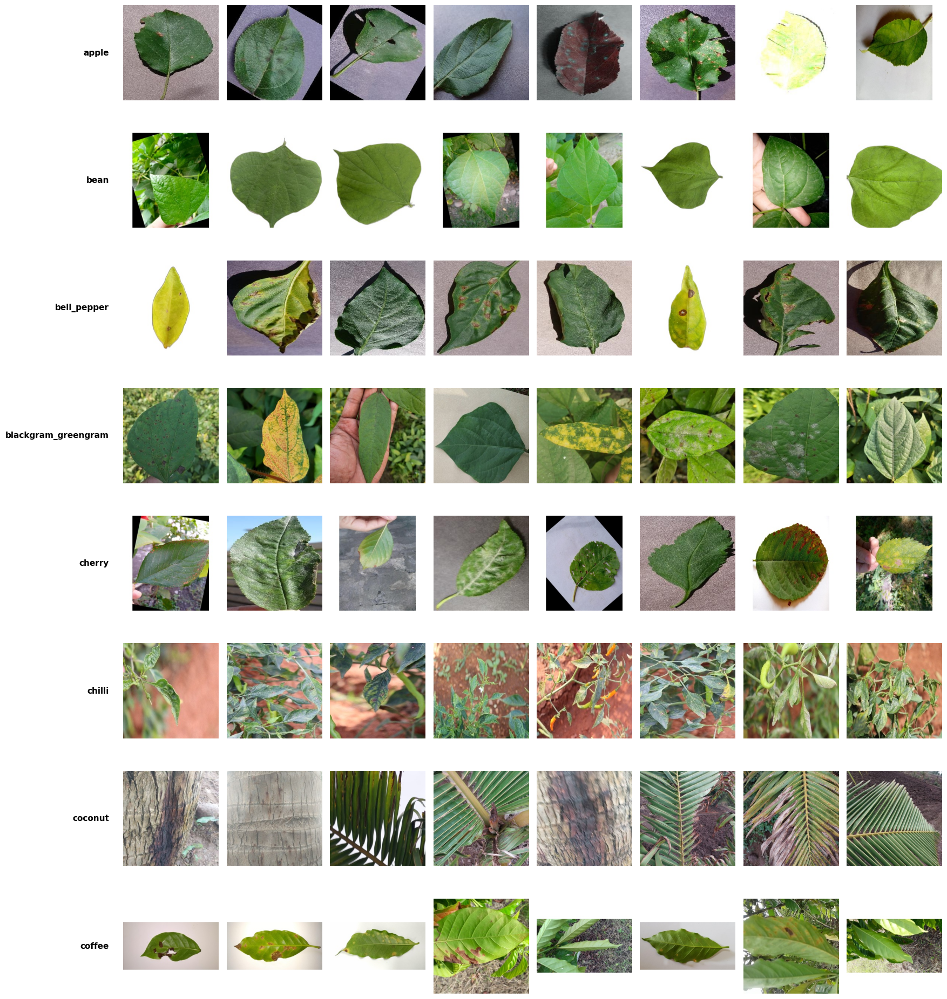

In [ ]:
contact_sheet(all_crops_sorted[0:8], n_samples=8)

In [ ]:
contact_sheet(all_crops_sorted[8:16], n_samples=8)

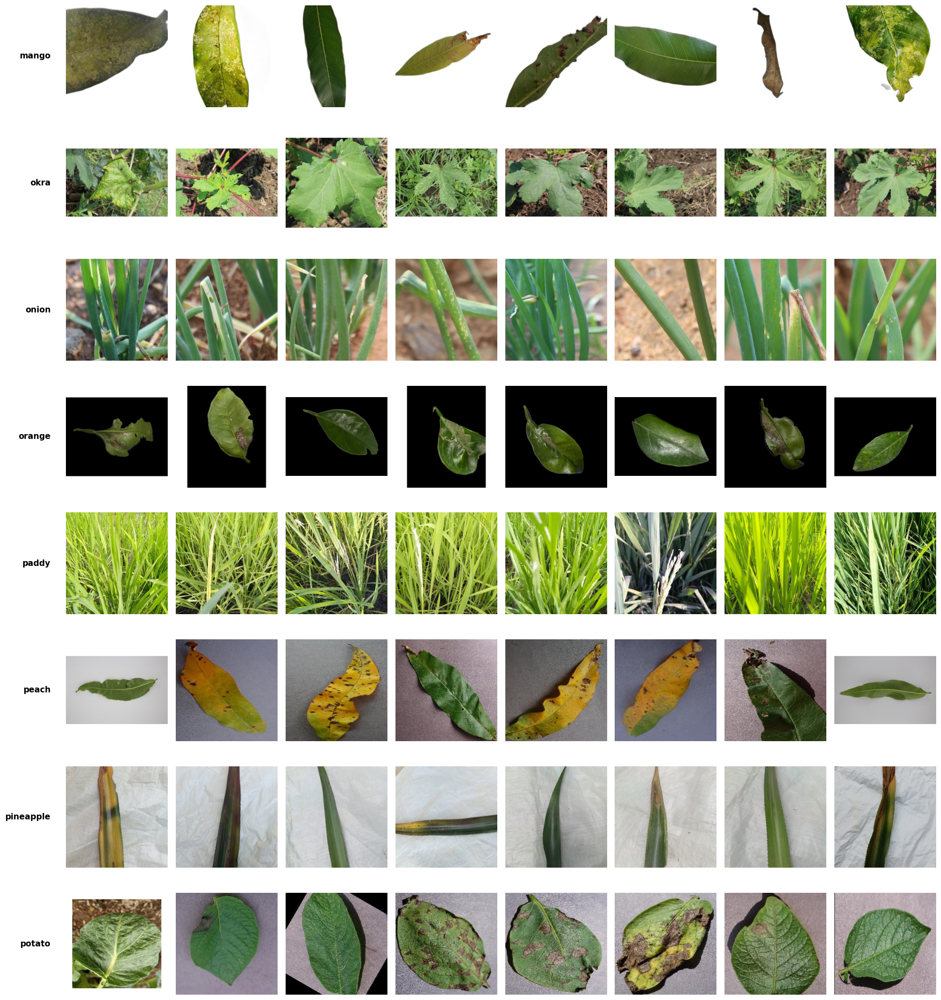

In [ ]:
contact_sheet(all_crops_sorted[16:24], n_samples=8)

In [ ]:
contact_sheet(all_crops_sorted[24:32], n_samples=8)